# Get Fav Character Color Palette

In [20]:
import pandas as pd

df_title = pd.read_csv("filtered_title_2.csv", delimiter=";")
df_title = df_title.loc[df_title.Ending != 'Unknown']

df_char = pd.read_csv("cleaned_char_dataset.csv", delimiter=";")

In [21]:
df_filtered = df_char.merge(df_title[['jp_title']], on='jp_title', how='inner')
df_filtered = df_filtered.dropna()
df_filtered = df_filtered.drop_duplicates(subset="char_name")
df_filtered.sample(10)

,jp_title,char_name,fav,img
9439,Goblin Slayer II,Elf (妖精弓手),676,https://cdn.myanimelist.net/images/characters/...
11832,Kami no Tou: Ouji no Kikan,Yihwa Yeon (연 이화 / 蓮梨花),123,https://cdn.myanimelist.net/images/characters/...
3071,Puraore! Pride of Orange,Mona Fujishiro (藤代 もな),2,https://cdn.myanimelist.net/images/characters/...
8137,Isekai Shoukan wa Nidome desu,Leviathan (リヴァイア),11,https://cdn.myanimelist.net/images/characters/...
8123,Mahoutsukai no Yome Season 2,Philomela Sargant (フィロメラ・サーガント),39,https://cdn.myanimelist.net/images/characters/...
8261,Kuma Kuma Kuma Bear Punch!,Shuri (シュリ),17,https://cdn.myanimelist.net/images/characters/...
9058,Sugar Apple Fairy Tale Part 2,Rafal Fen Rafal (ラファル・フェン・ラファル),7,https://cdn.myanimelist.net/images/characters/...
8837,Undead Girl Murder Farce,Arsene Lupin (アルセーヌ・ルパン),9,https://cdn.myanimelist.net/images/characters/...
6395,Do It Yourself!!,Kokoro Kouki (幸希 心),22,https://cdn.myanimelist.net/images/characters/...
9813,Atarashii Joushi wa Do Tennen,Grandmother Shirosaki,2,https://cdn.myanimelist.net/images/characters/...


In [22]:
from colorPallete import ColorPaletteExtractor

def get_color_palette(url, num_clusters=30):
    """Helper function to extract color palette from a URL."""
    extractor = ColorPaletteExtractor()
    try:
        extractor.load_image_from_url(url)
        extractor.extract_palette(num_clusters=num_clusters)
        palette = extractor.get_palette()
        # Convert BGR to RGB and then to hex
        return palette.tolist()
    except Exception as e:
        print(f"Error processing {url}: {e}")
        return []

n_filter = 10000

df_choosen = df_filtered.loc[df_filtered.fav > n_filter]
print(df_choosen.shape)
df_choosen

from tqdm.auto import tqdm

tqdm.pandas()

df_choosen['colors'] = df_choosen['img'].progress_apply(get_color_palette)
df_choosen.to_csv("fixed_filtered_char_color.csv")

# import numpy as np
# import concurrent.futures
# from colorPallete import ColorPaletteExtractor
# from tqdm.auto import tqdm

# def get_color_palette(url, num_clusters=30, timeout=60):
#     """Helper function to extract color palette from a URL with timeout."""
#     extractor = ColorPaletteExtractor()
    
#     def process():
#         """Inner function to process image within a thread."""
#         try:
#             extractor.load_image_from_url(url)
#             extractor.extract_palette(num_clusters=num_clusters)
#             palette = extractor.get_palette()
#             return palette.tolist()
#         except Exception as e:
#             print(f"Error processing {url}: {e}")
#             return []
    
#     with concurrent.futures.ThreadPoolExecutor() as executor:
#         future = executor.submit(process)
#         try:
#             return future.result(timeout=timeout)
#         except concurrent.futures.TimeoutError:
#             print(f"Timeout processing {url}")
#             return []

# n_filter = 20000  # Filter threshold

# df_choosen = df_filtered.loc[df_filtered.fav > n_filter]
# print(df_choosen.shape)

# tqdm.pandas()

# df_choosen['colors'] = df_choosen['img'].progress_apply(lambda url: get_color_palette(url, num_clusters=30))
# df_choosen.to_csv("filtered_char_color.csv")


(75, 4)


100%|██████████| 75/75 [02:11<00:00,  1.75s/it]
C:\Users\ASUS\AppData\Local\Temp\ipykernel_21720\702296223.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_choosen['colors'] = df_choosen['img'].progress_apply(get_color_palette)


In [23]:
test_read = pd.read_csv("fixed_filtered_char_color.csv")
test_read.head()

,Unnamed: 0,jp_title,char_name,fav,img,colors
0,0,Horimiya,Izumi Miyamura (宮村 伊澄),16137,https://cdn.myanimelist.net/images/characters/...,"[[194, 222, 249], [185, 220, 250], [177, 200, ..."
1,1,Horimiya,Kyouko Hori (堀 京子),12528,https://cdn.myanimelist.net/images/characters/...,"[[220, 237, 253], [208, 227, 250], [192, 203, ..."
2,10,Mushoku Tensei: Isekai Ittara Honki Dasu,Rudeus Greyrat (ルーデウス・グレイラット),10221,https://cdn.myanimelist.net/images/characters/...,"[[221, 234, 246], [179, 215, 251], [140, 207, ..."
3,20,Dr. Stone: Stone Wars,Senkuu Ishigami (石神 千空),22824,https://cdn.myanimelist.net/images/characters/...,"[[213, 231, 245], [203, 219, 236], [188, 205, ..."
4,30,Tensei shitara Slime Datta Ken 2nd Season,Rimuru Tempest (リムル＝テンペスト),23554,https://cdn.myanimelist.net/images/characters/...,"[[219, 232, 248], [178, 209, 229], [145, 164, ..."


# Clustering

In [28]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from ast import literal_eval
import matplotlib.pyplot as plt

In [49]:
# read selected character
df = pd.read_csv("fixed_filtered_char_color.csv")
df = df.drop(columns="Unnamed: 0")

# make sure
df = df.dropna()
df = df.drop_duplicates()

# checking dataset
print(df.shape)
df.head()

(75, 5)


,jp_title,char_name,fav,img,colors
0,Horimiya,Izumi Miyamura (宮村 伊澄),16137,https://cdn.myanimelist.net/images/characters/...,"[[194, 222, 249], [185, 220, 250], [177, 200, ..."
1,Horimiya,Kyouko Hori (堀 京子),12528,https://cdn.myanimelist.net/images/characters/...,"[[220, 237, 253], [208, 227, 250], [192, 203, ..."
2,Mushoku Tensei: Isekai Ittara Honki Dasu,Rudeus Greyrat (ルーデウス・グレイラット),10221,https://cdn.myanimelist.net/images/characters/...,"[[221, 234, 246], [179, 215, 251], [140, 207, ..."
3,Dr. Stone: Stone Wars,Senkuu Ishigami (石神 千空),22824,https://cdn.myanimelist.net/images/characters/...,"[[213, 231, 245], [203, 219, 236], [188, 205, ..."
4,Tensei shitara Slime Datta Ken 2nd Season,Rimuru Tempest (リムル＝テンペスト),23554,https://cdn.myanimelist.net/images/characters/...,"[[219, 232, 248], [178, 209, 229], [145, 164, ..."


In [50]:
# # change str -> np.array
# df['colors'] = df['colors'].apply(lambda x: np.array(literal_eval(x)))

# # Flatten the color arrays into a single feature vector per row (mean of RGB values)
# df['color_features'] = df['colors'].apply(lambda x: x.mean(axis=0) if x.size > 0 else np.zeros(3))

# # Convert to NumPy array for clustering
# X = np.vstack(df['color_features'].values)

# # Perform K-Means clustering (choose 2 clusters for example)
# kmeans = KMeans(n_clusters=5, random_state=42, n_init=10)
# df['cluster'] = kmeans.fit_predict(X)

# df.sample(5)

import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Convert string representation to numpy arrays
df['colors'] = df['colors'].apply(lambda x: np.array(literal_eval(x)))

# 1. Create better color features
def create_color_features(palette):
    """Create comprehensive color features for clustering"""
    if len(palette) == 0:
        return np.zeros(15)  # Handle empty palettes
    
    # Normalize color values to [0, 1]
    normalized = palette / 255.0
    
    # Basic statistics
    mean = normalized.mean(axis=0)
    std = normalized.std(axis=0)
    
    # Color diversity features
    unique_colors = np.unique(normalized, axis=0)
    unique_ratio = len(unique_colors) / len(palette)
    
    # Dominant color (using simple histogram)
    hist, bins = np.histogramdd(normalized, bins=(3,3,3), range=[(0,1),(0,1),(0,1)])
    dominant = hist.flatten() / hist.sum()
    
    # Combine all features
    return np.concatenate([
        mean,            # 3 features
        std,             # 3 features
        [unique_ratio],  # 1 feature
        dominant         # 27 features (3x3x3)
    ])                   # Total: 34 features

# 2. Create feature vectors
df['color_features'] = df['colors'].apply(create_color_features)

# 3. Standardize features
X = np.vstack(df['color_features'].values)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 4. Perform clustering with better initialization
kmeans = KMeans(
    n_clusters=8,
    random_state=42,
    n_init=10,
    init='k-means++',  # Better initialization than random
    max_iter=1000
)
df['cluster'] = kmeans.fit_predict(X_scaled)

# Show sample results
df.sample(5)

,jp_title,char_name,fav,img,colors,color_features,cluster
69,Ao no Exorcist: Shimane Illuminati-hen,Rin Okumura (奥村 燐),13411,https://cdn.myanimelist.net/images/characters/...,"[[209, 231, 250], [181, 184, 199], [154, 155, ...","[0.5456209150326798, 0.5101960784313726, 0.509...",2
52,Chainsaw Man,Makima (マキマ),16600,https://cdn.myanimelist.net/images/characters/...,"[[212, 229, 248], [173, 187, 203], [146, 159, ...","[0.4, 0.41856209150326795, 0.581437908496732, ...",1
1,Horimiya,Kyouko Hori (堀 京子),12528,https://cdn.myanimelist.net/images/characters/...,"[[220, 237, 253], [208, 227, 250], [192, 203, ...","[0.47058823529411775, 0.4917647058823528, 0.60...",2
21,Boku no Hero Academia 5th Season,Katsuki Bakugou (爆豪 勝己),23065,https://cdn.myanimelist.net/images/characters/...,"[[191, 229, 252], [181, 224, 248], [178, 212, ...","[0.31843137254901954, 0.3772549019607843, 0.49...",1
72,Kuroshitsuji: Kishuku Gakkou-hen,Ciel Phantomhive (シエル・ファントムハイヴ),11850,https://cdn.myanimelist.net/images/characters/...,"[[234, 239, 249], [216, 232, 249], [194, 223, ...","[0.3394771241830065, 0.3704575163398692, 0.466...",1


In [51]:
df.to_csv("8_cluster_character.csv")
# df.to_csv("6_cluster_character.csv")
# df.to_csv("7_cluster_character.csv")
# df.to_csv("3_cluster_character.csv")
# df.to_csv("5_cluster_character.csv")

Best 4, 5 , 6, 7

########## 0 ##########


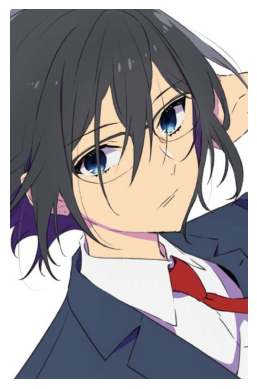

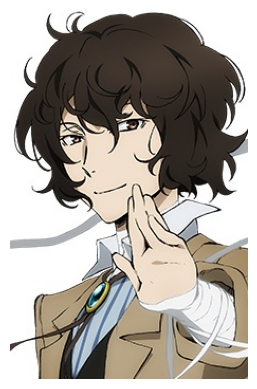

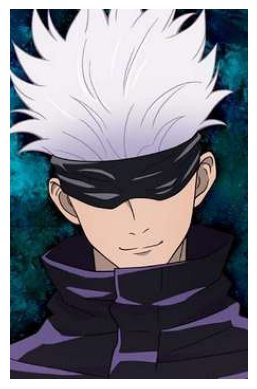

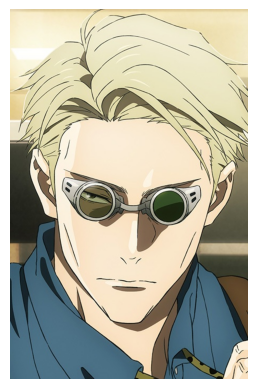

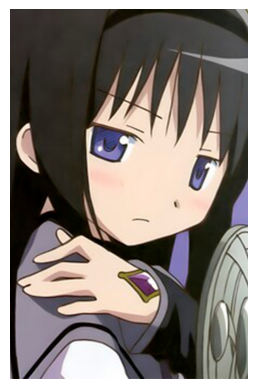

...

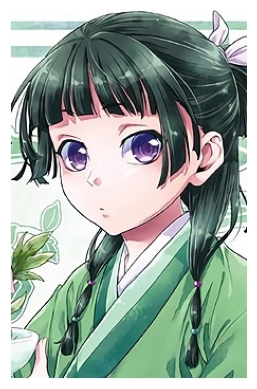

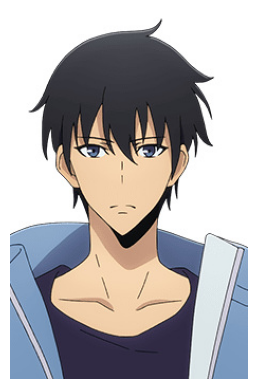

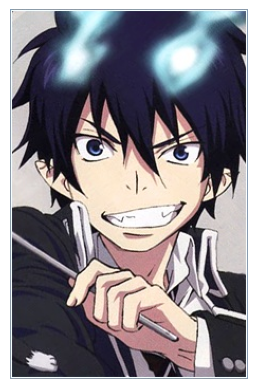

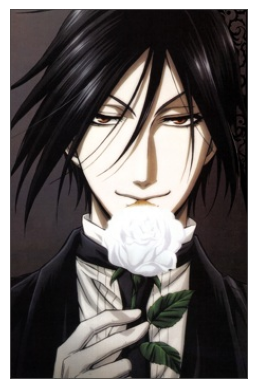

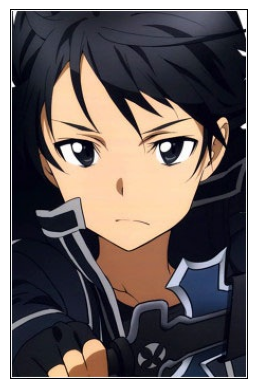

########## 1 ##########


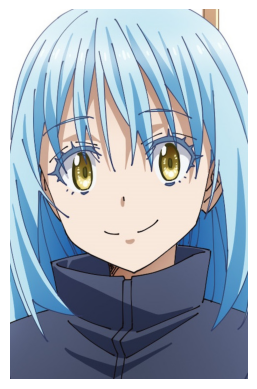

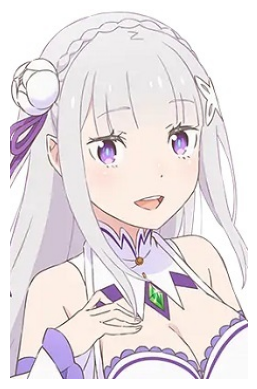

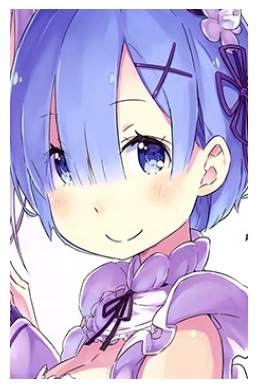

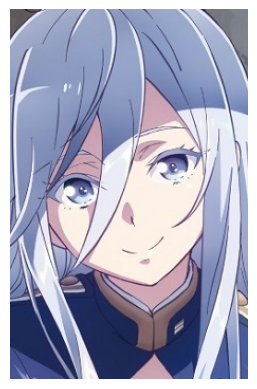

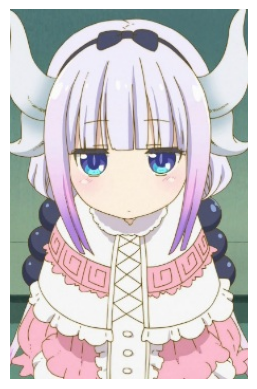

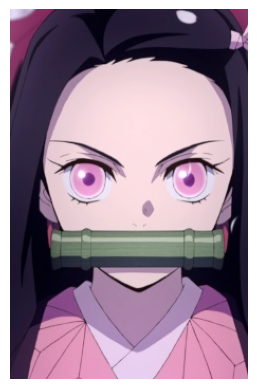

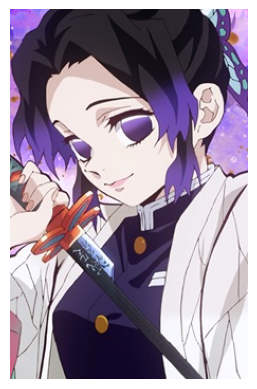

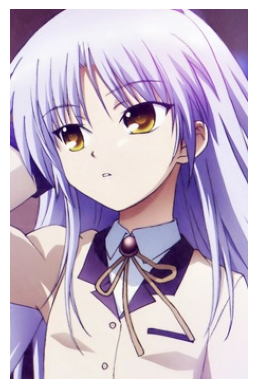

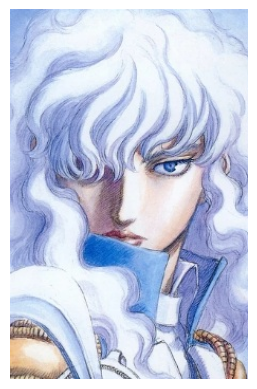

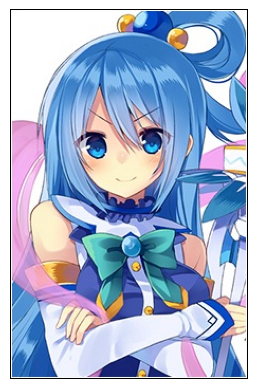

########## 2 ##########


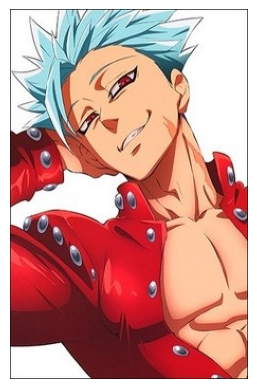

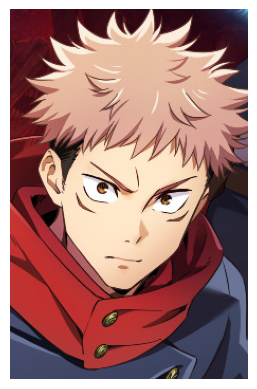

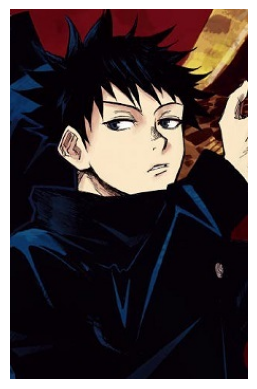

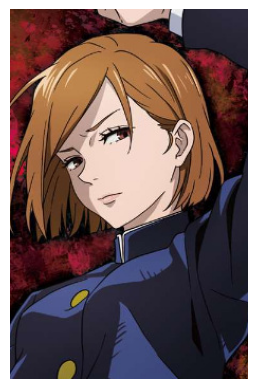

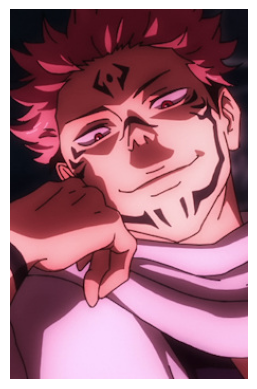

...

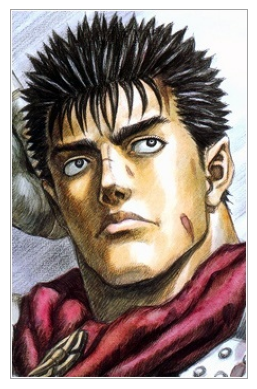

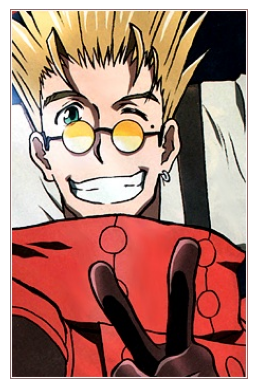

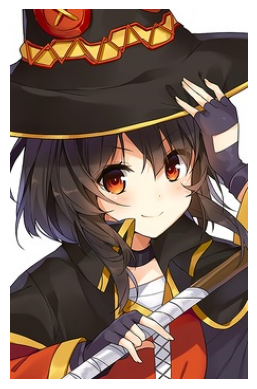

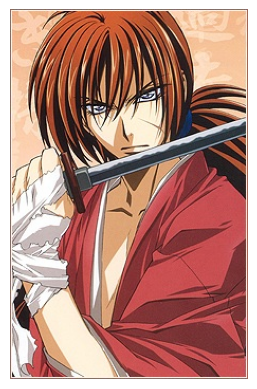

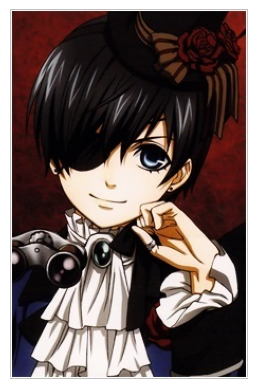

########## 3 ##########


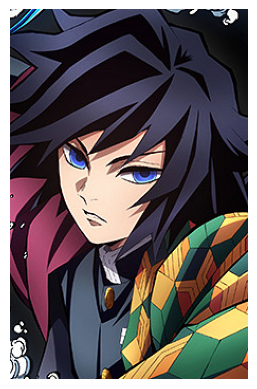

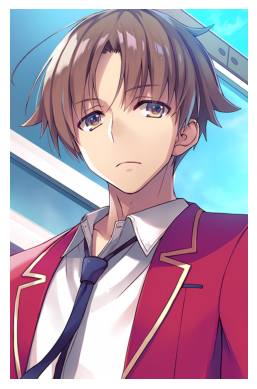

########## 4 ##########


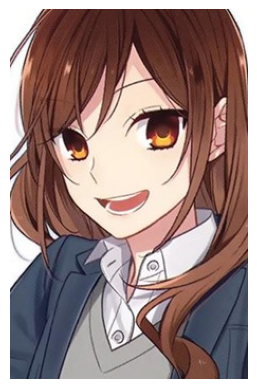

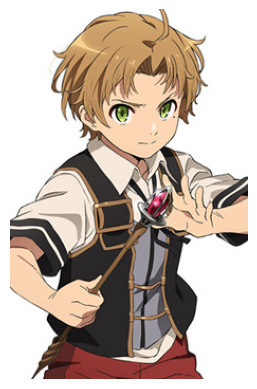

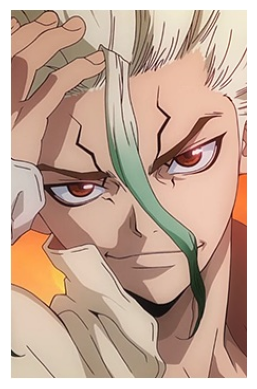

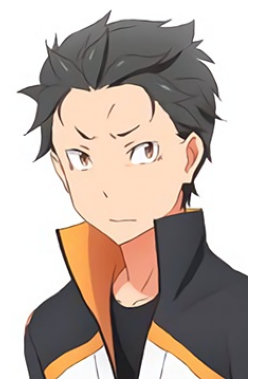

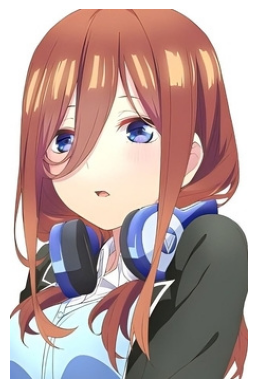

...

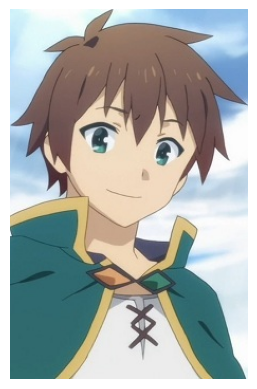

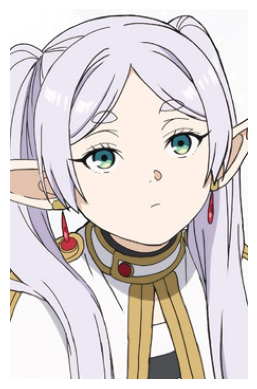

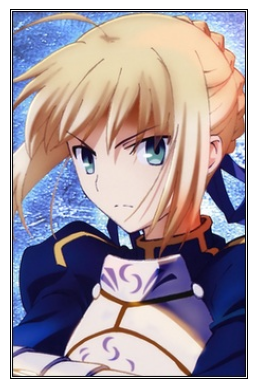

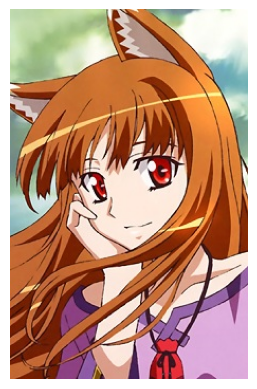

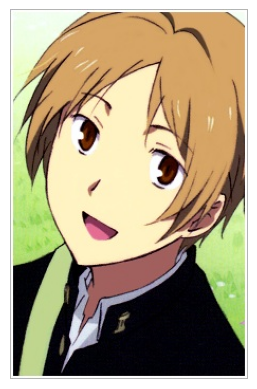

In [53]:
import requests
from PIL import Image
import matplotlib.pyplot as plt
from io import BytesIO

df = pd.read_csv("5_cluster_character.csv")

# URL of the image
for cluster in sorted(df.cluster.unique()):
    print("#"*10, cluster, "#"*10)
    vis_df = df.loc[df.cluster == cluster]    
    for url in vis_df.img:
        # Fetch the image from the URL
        response = requests.get(url)
        img = Image.open(BytesIO(response.content))

        # Display the image using matplotlib
        plt.imshow(img)
        plt.axis("off")  # Hide axes
        plt.show()




In [ ]:
df.loc[df.cluster == 4]

,jp_title,char_name,fav,img,colors,color_features,cluster
37,Nanatsu no Taizai: Funnu no Shinpan,Escanor (エスカノール),7782,https://cdn.myanimelist.net/images/characters/...,"[[178, 189, 200], [128, 159, 195], [118, 143, ...","[69.73333333333333, 92.4, 116.4]",4
41,Log Horizon: Entaku Houkai,Akatsuki (アカツキ),2792,https://cdn.myanimelist.net/images/characters/...,"[[218, 226, 236], [97, 195, 197], [171, 162, 2...","[95.73333333333333, 104.13333333333334, 134.86...",4
52,Jujutsu Kaisen,Yuuji Itadori (虎杖 悠仁),16760,https://cdn.myanimelist.net/images/characters/...,"[[228, 241, 251], [194, 225, 251], [159, 182, ...","[90.06666666666666, 90.06666666666666, 133.266...",4
53,Jujutsu Kaisen,Megumi Fushiguro (伏黒 恵),12728,https://cdn.myanimelist.net/images/characters/...,"[[201, 230, 248], [167, 196, 223], [144, 164, ...","[74.26666666666667, 87.93333333333334, 113.333...",4
54,Jujutsu Kaisen,Nobara Kugisaki (釘崎 野薔薇),10617,https://cdn.myanimelist.net/images/characters/...,"[[201, 214, 242], [146, 158, 187], [76, 127, 1...","[64.46666666666667, 68.13333333333334, 102.933...",4
57,Jujutsu Kaisen,Maki Zenin (禪院 真希),8828,https://cdn.myanimelist.net/images/characters/...,"[[208, 230, 252], [179, 192, 217], [137, 153, ...","[95.66666666666667, 110.26666666666667, 98.933...",4
60,Jujutsu Kaisen,Suguru Getou (夏油 傑),5595,https://cdn.myanimelist.net/images/characters/...,"[[182, 195, 219], [166, 181, 209], [152, 166, ...","[86.26666666666667, 93.13333333333334, 106.2]",4
77,Boku no Hero Academia 5th Season,Izuku Midoriya (緑谷 出久),25537,https://cdn.myanimelist.net/images/characters/...,"[[184, 217, 252], [94, 131, 185], [75, 89, 110...","[81.6, 91.13333333333334, 102.2]",4
79,Boku no Hero Academia 5th Season,Katsuki Bakugou (爆豪 勝己),23065,https://cdn.myanimelist.net/images/characters/...,"[[181, 220, 250], [148, 182, 209], [111, 142, ...","[81.2, 92.46666666666667, 129.66666666666666]",4
80,Boku no Hero Academia 5th Season,All Might (オール・マイト),9777,https://cdn.myanimelist.net/images/characters/...,"[[182, 207, 241], [130, 158, 216], [88, 129, 1...","[85.53333333333333, 108.8, 146.2]",4


In [ ]:

# df['colors'] = df['colors'].apply(lambda x: np.array(literal_eval(x)))
# df.head()

,jp_title,char_name,fav,img,colors
0,Dr. Stone: Stone Wars,Senkuu Ishigami (石神 千空),22824,https://cdn.myanimelist.net/images/characters/...,"[[206, 222, 238], [185, 202, 218], [172, 193, ..."
1,Tensei shitara Slime Datta Ken 2nd Season,Rimuru Tempest (リムル＝テンペスト),23554,https://cdn.myanimelist.net/images/characters/...,"[[218, 231, 247], [144, 164, 199], [122, 128, ..."
2,Re:Zero kara Hajimeru Isekai Seikatsu 2nd Seas...,Emilia (エミリア),23267,https://cdn.myanimelist.net/images/characters/...,"[[229, 238, 252], [186, 193, 238], [67, 58, 73..."
3,Re:Zero kara Hajimeru Isekai Seikatsu 2nd Seas...,Subaru Natsuki (ナツキ・スバル),21895,https://cdn.myanimelist.net/images/characters/...,"[[197, 222, 253], [177, 189, 208], [127, 156, ..."
4,Re:Zero kara Hajimeru Isekai Seikatsu 2nd Seas...,Rem (レム),45866,https://cdn.myanimelist.net/images/characters/...,"[[207, 221, 250], [187, 168, 234], [52, 12, 33..."


In [32]:
# Flatten the color arrays into a single feature vector per row (mean of RGB values)
df['color_features'] = df['colors'].apply(lambda x: x.mean(axis=0) if x.size > 0 else np.zeros(3))

# Convert to NumPy array for clustering
X = np.vstack(df['color_features'].values)

# Perform K-Means clustering (choose 2 clusters for example)
kmeans = KMeans(n_clusters=5, random_state=42, n_init=10)
df['cluster'] = kmeans.fit_predict(X)

print(df[['color_features', 'cluster']])

                                       color_features  cluster
0     [123.6, 143.46666666666667, 173.33333333333334]        3
1     [158.73333333333332, 145.4, 131.46666666666667]        1
2                  [183.6, 171.2, 186.46666666666667]        1
3                  [108.0, 123.53333333333333, 150.4]        2
4   [189.66666666666666, 147.73333333333332, 165.8...        1
5   [147.46666666666667, 141.53333333333333, 160.2...        3
6     [126.86666666666666, 135.53333333333333, 142.0]        3
7     [125.26666666666667, 112.53333333333333, 102.6]        4
8                    [81.6, 91.13333333333334, 102.2]        0
9     [102.06666666666666, 105.73333333333333, 134.6]        2
10      [81.2, 92.46666666666667, 129.66666666666666]        0
11    [158.73333333333332, 145.4, 131.46666666666667]        1
12    [158.73333333333332, 145.4, 131.46666666666667]        1
13                 [107.33333333333333, 109.0, 117.2]        4
14                   [81.6, 91.13333333333334, 102.2]  

In [37]:
df.loc[df.cluster == 0].sample(5)

,Unnamed: 0.1,test,Unnamed: 0,jp_title,en_title,char_name,fav,img,colors,color_features,cluster
1387,8705,8705,7,Kimetsu no Yaiba: Hashira Geiko-hen,Demon Slayer: Kimetsu no Yaiba Hashira Trainin...,Tengen Uzui (宇髄 天元),"Member Favorites: 5,664",https://cdn.myanimelist.net/images/characters/...,"[[20, 17, 18], [196, 218, 244], [87, 78, 55], ...","[123.3, 124.7, 133.5]",0
87,197,197,197,Yuru Camp△ Season 2,Laid-Back Camp Season 2,Ayano Toki (土岐 綾乃),Member Favorites: 49,https://cdn.myanimelist.net/images/characters/...,"[[254, 254, 254], [110, 149, 139], [68, 64, 79...","[121.1, 132.0, 140.9]",0
1283,8007,8007,3,Ore dake Level Up na Ken,Solo Leveling,Jin-Ah Sung (성진아),Member Favorites: 318,https://cdn.myanimelist.net/images/characters/...,"[[253, 253, 252], [106, 83, 100], [193, 152, 9...","[139.5, 133.5, 147.0]",0
599,3382,3382,189,Honzuki no Gekokujou: Shisho ni Naru Tame ni w...,Ascendance of a Bookworm Season 3,Fran (フラン),Member Favorites: 6,https://cdn.myanimelist.net/images/characters/...,"[[254, 254, 254], [175, 168, 169], [70, 61, 50...","[145.6, 137.5, 136.7]",0
1280,8004,8004,0,Ore dake Level Up na Ken,Solo Leveling,Jin-Woo Sung (성 진우),"Member Favorites: 17,628",https://cdn.myanimelist.net/images/characters/...,"[[254, 254, 254], [76, 67, 67], [193, 159, 129...","[138.8, 135.9, 139.5]",0


In [38]:
df.loc[df.cluster == 1].sample(5)

,Unnamed: 0.1,test,Unnamed: 0,jp_title,en_title,char_name,fav,img,colors,color_features,cluster
1091,6454,6454,534,Meitantei Conan,Case Closed,Ai Haibara (灰原 哀),"Member Favorites: 2,544",https://cdn.myanimelist.net/images/characters/...,"[[183, 209, 250], [65, 111, 153], [37, 53, 58]...","[82.4, 98.6, 144.3]",1
1570,9959,9959,551,Boku no Hero Academia 7th Season,My Hero Academia Season 7,Izuku Midoriya (緑谷 出久),"Member Favorites: 25,534",https://cdn.myanimelist.net/images/characters/...,"[[76, 97, 7], [184, 217, 252], [2, 2, 118], [1...","[88.1, 97.8, 129.3]",1
1100,6483,6483,563,Golden Kamuy 4th Season,Golden Kamuy Season 4,Saichi Sugimoto (杉元 佐一),"Member Favorites: 2,836",https://cdn.myanimelist.net/images/characters/...,"[[5, 5, 11], [156, 197, 233], [55, 99, 124], [...","[83.9, 101.0, 128.7]",1
440,2637,2637,10,Shingeki no Kyojin: The Final Season Part 2,Attack on Titan: Final Season Part 2,Eren Yeager (エレン・イェーガー),"Member Favorites: 71,892",https://cdn.myanimelist.net/images/characters/...,"[[8, 16, 10], [176, 193, 199], [48, 72, 60], [...","[104.7, 130.7, 140.2]",1
943,5685,5685,570,Boku no Hero Academia 6th Season,My Hero Academia Season 6,All Might (オール・マイト),"Member Favorites: 9,777",https://cdn.myanimelist.net/images/characters/...,"[[2, 240, 254], [10, 6, 11], [80, 118, 163], [...","[89.6, 124.8, 160.4]",1


In [ ]:
df.loc[df.cluster == 2].sample(5)

,Unnamed: 0.1,test,Unnamed: 0,jp_title,en_title,char_name,fav,img,colors,color_features,cluster
452,2649,2649,22,Sono Bisque Doll wa Koi wo Suru,My Dress-Up Darling,Sajuna Inui (乾 紗寿叶),Member Favorites: 501,https://cdn.myanimelist.net/images/characters/...,"[[187, 193, 233], [100, 105, 132], [253, 253, ...","[125.2, 128.9, 158.9]",2
336,1820,1820,396,Meitantei Conan,Case Closed,Mitsuhiko Tsuburaya (円谷 光彦),Member Favorites: 41,https://cdn.myanimelist.net/images/characters/...,"[[39, 47, 59], [157, 200, 246], [113, 128, 140...","[118.4, 136.2, 149.7]",2
448,2645,2645,18,Shingeki no Kyojin: The Final Season Part 2,Attack on Titan: Final Season Part 2,Annie Leonhart (アニ・レオンハート),"Member Favorites: 6,027",https://cdn.myanimelist.net/images/characters/...,"[[167, 187, 198], [49, 86, 135], [206, 233, 25...","[115.8, 142.8, 158.8]",2
577,3310,3310,117,Paripi Koumei,Ya Boy Kongming!,Steve Kido (スティーブ・キド ),Member Favorites: 3,https://cdn.myanimelist.net/images/characters/...,"[[168, 186, 195], [25, 33, 49], [83, 122, 177]...","[104.2, 128.4, 155.6]",2
1426,8754,8754,56,Boku no Hero Academia 7th Season,My Hero Academia Season 7,Himiko Toga (渡我 被身子),"Member Favorites: 5,626",https://cdn.myanimelist.net/images/characters/...,"[[108, 139, 155], [206, 223, 240], [38, 49, 86...","[112.9, 126.9, 171.5]",2


In [54]:
df.loc[df.cluster == 3].sample(5)

,Unnamed: 0.1,test,Unnamed: 0,jp_title,en_title,char_name,fav,img,colors,color_features,cluster
248,993,993,236,Nomad: Megalo Box 2,Megalobox 2: Nomad,Marla (マーラ),Member Favorites: 10,https://cdn.myanimelist.net/images/characters/...,"[[108, 137, 162], [50, 63, 65], [77, 104, 118]...","[93.8, 110.5, 110.0]",3
823,4714,4714,243,Golden Kamuy 4th Season,Golden Kamuy Season 4,Hyakunosuke Ogata (尾形 百之助),"Member Favorites: 1,598",https://cdn.myanimelist.net/images/characters/...,"[[253, 254, 254], [40, 48, 47], [99, 131, 145]...","[95.9, 99.8, 100.7]",3
1574,9963,9963,555,Boku no Hero Academia 7th Season,My Hero Academia Season 7,Shouta Aizawa (相澤 消太),"Member Favorites: 7,841",https://cdn.myanimelist.net/images/characters/...,"[[12, 1, 119], [167, 171, 176], [17, 17, 16], ...","[71.6, 72.9, 110.0]",3
1594,9983,9983,575,Ookami to Koushinryou: Merchant Meets the Wise...,Spice and Wolf: Merchant Meets the Wise Wolf,Dian Rubens (ディアン・ルーベンス),Member Favorites: 27,https://cdn.myanimelist.net/images/characters/...,"[[37, 39, 42], [125, 143, 159], [20, 19, 19], ...","[54.0, 61.0, 68.0]",3
850,4975,4975,504,Meitantei Conan,Case Closed,Conan Edogawa (江戸川 コナン),"Member Favorites: 7,468",https://cdn.myanimelist.net/images/characters/...,"[[97, 131, 180], [58, 32, 12], [164, 156, 140]...","[81.5, 88.4, 107.0]",3
